## Ejercicios plotly

In [52]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px

from datetime import datetime

**ref**: _https://www.kaggle.com/datasets/matthieugimbert/french-bakery-daily-sales_

### Ejercicio 0:
- Carga el DataFrame **`Bakery sales.csv`**.

In [53]:
df = pd.read_csv("Bakery sales.csv")

df

,Unnamed: 0,date,time,ticket_number,article,Quantity,unit_price
0,0,2021-01-02,08:38,150040.0,BAGUETTE,1.0,"0,90 €"
1,1,2021-01-02,08:38,150040.0,PAIN AU CHOCOLAT,3.0,"1,20 €"
2,4,2021-01-02,09:14,150041.0,PAIN AU CHOCOLAT,2.0,"1,20 €"
3,5,2021-01-02,09:14,150041.0,PAIN,1.0,"1,15 €"
4,8,2021-01-02,09:25,150042.0,TRADITIONAL BAGUETTE,5.0,"1,20 €"
...,...,...,...,...,...,...,...
234000,511387,2022-09-30,18:52,288911.0,COUPE,1.0,"0,15 €"
234001,511388,2022-09-30,18:52,288911.0,BOULE 200G,1.0,"1,20 €"
234002,511389,2022-09-30,18:52,288911.0,COUPE,2.0,"0,15 €"
234003,511392,2022-09-30,18:55,288912.0,TRADITIONAL BAGUETTE,1.0,"1,30 €"


### Ejercicio 1:
- Transforma la columna **`unit_price`** a `float`.


- Transforma la columna **`date`** a `datetime`.


- Crea las columnas **`weekday`**, **`month`**, **`year`** y **`hour`**. Las columnas **`weekday`** y **`month`** deben estar representados por nombre, no por número.

In [54]:
# Utiliza el método str.replace() para eliminar el caracter
df['unit_price'] = df['unit_price'].str.replace('€', '')

In [55]:
df['unit_price'] = df['unit_price'].str.replace(',', '.')

In [56]:
# Convertir la columna a tipo float
df['unit_price'] = df['unit_price'].astype(float)

In [57]:
df['date'] = pd.to_datetime(df['date'])

In [58]:
df['month'] = df['date'].dt.strftime('%B')


In [59]:
df["weekday"] = df["date"].dt.strftime("%A")

In [60]:
df["year"] = df["date"].dt.strftime("%Y")

In [61]:
# Convertir la columna 'hora' al formato datetime
df['time'] = pd.to_datetime(df['time'], format='%H:%M')

In [62]:
df["hour"] = df["time"].dt.strftime("%H")

In [63]:
df

,Unnamed: 0,date,time,ticket_number,article,Quantity,unit_price,month,weekday,year,hour
0,0,2021-01-02,1900-01-01 08:38:00,150040.0,BAGUETTE,1.0,0.90,January,Saturday,2021,08
1,1,2021-01-02,1900-01-01 08:38:00,150040.0,PAIN AU CHOCOLAT,3.0,1.20,January,Saturday,2021,08
2,4,2021-01-02,1900-01-01 09:14:00,150041.0,PAIN AU CHOCOLAT,2.0,1.20,January,Saturday,2021,09
3,5,2021-01-02,1900-01-01 09:14:00,150041.0,PAIN,1.0,1.15,January,Saturday,2021,09
4,8,2021-01-02,1900-01-01 09:25:00,150042.0,TRADITIONAL BAGUETTE,5.0,1.20,January,Saturday,2021,09
...,...,...,...,...,...,...,...,...,...,...,...
234000,511387,2022-09-30,1900-01-01 18:52:00,288911.0,COUPE,1.0,0.15,September,Friday,2022,18
234001,511388,2022-09-30,1900-01-01 18:52:00,288911.0,BOULE 200G,1.0,1.20,September,Friday,2022,18
234002,511389,2022-09-30,1900-01-01 18:52:00,288911.0,COUPE,2.0,0.15,September,Friday,2022,18
234003,511392,2022-09-30,1900-01-01 18:55:00,288912.0,TRADITIONAL BAGUETTE,1.0,1.30,September,Friday,2022,18


### Ejercicio 2:

¿A que hora se venden más productos?

- Grafica un histograma usando la columna de `hour` y `quantity`.
- Agrega el parámetro `color = year` y `nbins = 50`.

In [64]:
px.histogram(data_frame = df, 
             x          = "hour",
             y = "Quantity",
             color      = "year",
             nbins      = 50)


### Ejercicio 3:
- De la gráfica anterior quita el filtro por color y separa la gráfica en dos, usando el parámetro `facet_col`.
- Agrega a esa gráfica un violin plot usando el parámetro `marginal`.

In [65]:
px.histogram(data_frame = df, 
             x          = "hour",
             y = "Quantity",
             facet_col      = "year",
             nbins      = 50,
             marginal = "violin")


### Ejercicio 4:

- Filtra el **DataFrame** por las filas donde la columna `article` tenga la palabra **"BAGUETTE"**.
    - ```html
      df[df["article"].str.contains("")]
      ```
    
- Haz una gráfica de **`sunburst`**, separando por año y mes, mostrando la cantidad de elementos vendidos usando el filtro de **"BAGUETTE"**.

In [66]:
baguettes = df[df["article"] == "BAGUETTE"]

In [67]:

fig = px.sunburst(data_frame = baguettes,
                  values     = "Quantity",
                  path       = ["year", "month"],
                  title = "Baguettes vendidas por año y mes",
                  #color_discrete_sequence=px.colors.qualitative.Plotly)
                  color = "month")


fig.update_traces(textinfo = "label+percent parent")
fig

### Ejercicio 5:
- Calcula el precio total de cada fila, multiplicando las columnas `quantity` y `unit_price`. Crea una nueva columna `total_article_price` con esta información.

- Elimina las filas donde `quantity` tiene un outlier.

- Haz un violin plot con esa nueva columna.

In [68]:
df["total_article_price"] = df["Quantity"] * df["unit_price"]

In [72]:
# Calcular los cuartiles y el IQR
Q1 = df['Quantity'].quantile(0.25)
Q3 = df['Quantity'].quantile(0.75)
IQR = Q3 - Q1

In [74]:
# Identificar outliers
outliers = (df['Quantity'] < Q1 - 1.5 * IQR) | (df['Quantity'] > Q3 + 1.5 * IQR)

In [78]:
df = df[~outliers]

C:\Users\Ane Zubieta\AppData\Local\Temp\ipykernel_20656\4214066566.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



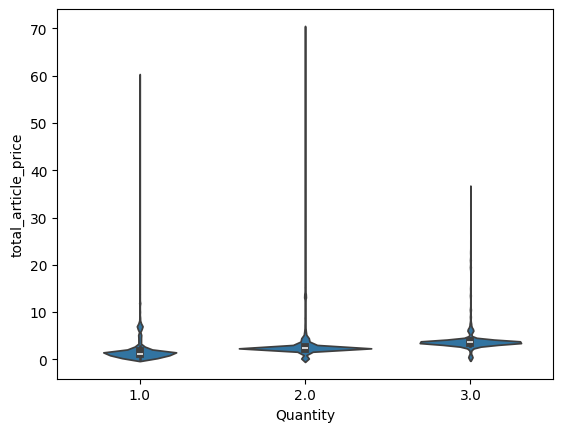

In [84]:
sns.violinplot(y = df.total_article_price,
               x = df.Quantity)

plt.show()

### Ejercicio 6:
- Agrupa el **DataFrame** por fecha y obten la suma de la columna **`total_article_price`**. Crea un **DataFrame** nuevo.
- Busca la forma de quedarte con la columna **`weekday`** durante la agrupación.
- Haz un line plot con este **DataFrame**, utiliza también la columna **`weekday`**.

In [87]:
df_suma = df.groupby(['date', 'weekday'])['total_article_price'].sum().reset_index()

In [92]:
df_suma

,date,weekday,total_article_price
0,2021-01-02,Saturday,830.75
1,2021-01-03,Sunday,909.75
2,2021-01-04,Monday,375.40
3,2021-01-05,Tuesday,480.60
4,2021-01-07,Thursday,490.50
...,...,...,...
595,2022-09-26,Monday,649.85
596,2022-09-27,Tuesday,708.25
597,2022-09-28,Wednesday,581.80
598,2022-09-29,Thursday,622.15


In [94]:
px.line(data_frame = df_suma,
        y = "weekday"
       )

### Ejercicio 7:
- Crea un nuevo DataFrame agrupando por la columna **`ticket_number`**, que tenga como columnas la suma de **`quantity`**, **`total_article_price`** y el maximo de **`year`**. Renombra las columnas.

- Haz un box plot usando la columnas **`quantity`** y **`year`**.

In [98]:
# Agrupar por 'ticket_number' y realizar las operaciones
#A continuación, usamos el método agg para realizar varias agregaciones en las columnas de interés. Específicamente:
df_nuevo = df.groupby('ticket_number').agg(
    suma_quantity=('Quantity', 'sum'),
    suma_total_price=("total_article_price", 'sum'),
    max_year=("year", "max")
).reset_index()

### Ejercicio 8:
- Haz un pie plot mostrando el total vendido por día de la semana.
- Haz un pie plot mostrando el total vendido por mes.

### Ejercicio 9:
- Agrupa los datos por la columna **`article`** y crea un nuevo DataFrame, donde las columnas sean la suma de **`quantity`** y **`total_article_price`** y la media de **`unit_price`** y el mínimo/máximo de **`year`**.
- Encuentra cuales son los 20 elementos más vendidos y muestralos en un bar plot, usa la columna **`total_article_price`** con el parámetro `color`.

### Ejercicio 10:
- Usando el DataFrame, crea una nueva columna **`article_new`**, si el artículo de esa fila no está entre los 20 más vendidos entonces que tenga el nombre de **`OTRO`**, si el artículo está si entre los 20 más vendidos que no se cambie el nombre.

- Repite el bar plot anterior, esta vez usando todas las filas.

In [ ]:
################################################################################################################################